# Frequency vs Tilt: MSD's and transport velocity

Here we explore the results of the simulations that map the space of frequency vs tilt

In [1]:
import sys
import os
sys.path.insert(0, './magcolloids')

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import HTML, clear_output
import jsonpickle
import scipy.optimize as spo
import scipy.spatial as spa 
import magcolloid as mgc
import matplotlib as mpl
import string as st

from tqdm import tqdm_notebook

ureg = mgc.ureg

idx = pd.IndexSlice

%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
directory = "D:/MapFrequencies2/"
index = pd.read_csv(os.path.join(directory,"index.dat"), sep = " ", names = ["name","frequency","tilt"])

In [3]:
index.head()

,name,frequency,tilt
0,Tilt_0.625_deg_freq0.5_2019_03_01_18_33_31,0.5,0.625
1,Tilt_3.125_deg_freq0.5_2019_03_01_18_33_32,0.5,3.125
2,Tilt_4.375_deg_freq0.5_2019_03_01_18_33_32,0.5,4.375
3,Tilt_3.75_deg_freq0.5_2019_03_01_18_33_32,0.5,3.750
4,Tilt_1.25_deg_freq0.5_2019_03_01_18_33_31,0.5,1.250


# Support Functions

We need some functions for loading trayectories and to create multiline plots like the ones below.

In [4]:
from matplotlib.collections import LineCollection

def multiline(xs, ys, c, ax=None, **kwargs):
    """Plot lines with different colorings

    Parameters
    ----------
    xs : iterable container of x coordinates
    ys : iterable container of y coordinates
    c : iterable container of numbers mapped to colormap
    ax (optional): Axes to plot on.
    kwargs (optional): passed to LineCollection

    Notes:
        len(xs) == len(ys) == len(c) is the number of line segments
        len(xs[i]) == len(ys[i]) is the number of points for each line (indexed by i)

    Returns
    -------
    lc : LineCollection instance.
    """

    # find axes
    ax = plt.gca() if ax is None else ax

    # create LineCollection
    segments = [np.column_stack([x, y]) for x, y in zip(xs, ys)]
    lc = LineCollection(segments, **kwargs)

    # set coloring of line segments
    #    Note: I get an error if I pass c as a list here... not sure why.
    lc.set_array(np.asarray(c))

    # add lines to axes and rescale 
    #    Note: adding a collection doesn't autoscalee xlim/ylim
    ax.add_collection(lc)
    ax.autoscale()
    return lc

In [5]:
def load_trj(name,directory):
    
    lz_trj = mgc.trj_lazyread(os.path.join(directory,name),["x","y","z","mux","muy","muz","fx","fy"])
    trj = lz_trj[:].filter(["x","y","z"])
        
    bounds = lz_trj.get_bounds()
        
    return trj, bounds

We unwrap the trayectories to deal with periodic boundaries.

In [6]:
def unwrap_trj(trj,bounds):
    
    trj2 = trj.copy(deep=True)
    
    def unwrap(p):
        p.iloc[:] = np.unwrap(p,axis=0)
        return p

    for c in trj.columns:
        trj2[c] = (trj2[c] - bounds[c+"_min"])/(bounds[c+"_max"] - bounds[c+"_min"])

    trj2 = (trj2*2*np.pi).groupby("id").apply(unwrap)/(2*np.pi)

    for c in trj.columns:
        trj2[c] = trj2[c]*(bounds[c+"_max"] - bounds[c+"_min"]) + bounds[c+"_min"]
        
    return trj2

# Read MSD's and obtain an average series from each file. 

In [7]:
msd = pd.concat([pd.read_csv(os.path.join(
    directory,name["name"]+".msd"),sep=",",index_col=[0,1]).groupby("dt").mean() 
           for i,name in tqdm_notebook(index.iterrows())],
         keys = index.index.values, names = ["file"])

A Jupyter Widget

C:\ProgramFiles\Anaconda3\lib\site-packages\numpy\lib\arraysetops.py:472: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [8]:
msd["msd"] = msd.sum(axis=1)

In [9]:
msd["file"] = msd.index.get_level_values("file")
msd["dt"] = msd.index.get_level_values("dt")/75
msd = msd.set_index(["file","dt"])

In [10]:
msd.head()

msd_x     msd_y     msd_z       msd
file dt                                              
0    0.013333  0.002731  0.002738  0.000032  0.005501
     0.026667  0.008013  0.008039  0.000032  0.016083
     0.040000  0.015900  0.015974  0.000032  0.031905
     0.053333  0.026424  0.026567  0.000032  0.053022
     0.066667  0.039592  0.039831  0.000032  0.079455

In [11]:
msd.to_csv(os.path.join(directory,"MSD_Mean.dat"),sep="\t")

# Calculate exponents

We fit the msd to a line. The slope of the line gives the exponent which characterises the movement

In [12]:
msd = pd.read_csv(os.path.join(directory,"MSD_Mean.dat"),sep="\t",index_col=[0,1])

C:\ProgramFiles\Anaconda3\lib\site-packages\numpy\lib\arraysetops.py:472: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [13]:
lin_fun = lambda x,A,B: A*x+B

index["alpha"] = np.NaN
index["beta"] = np.NaN

for n,an_msd in tqdm_notebook(msd.groupby("file")):
        
    x = np.log(an_msd.index.get_level_values("dt"))
    y = np.log(an_msd.msd)
    
    mask = (x>0*np.log(10)) & (x<1*np.log(10))
    
    fit = spo.curve_fit(lin_fun, x[mask], y[mask])
    
    index.loc[n,"alpha"] = fit[0][0]
    index.loc[n,"beta"] = fit[0][1]

A Jupyter Widget

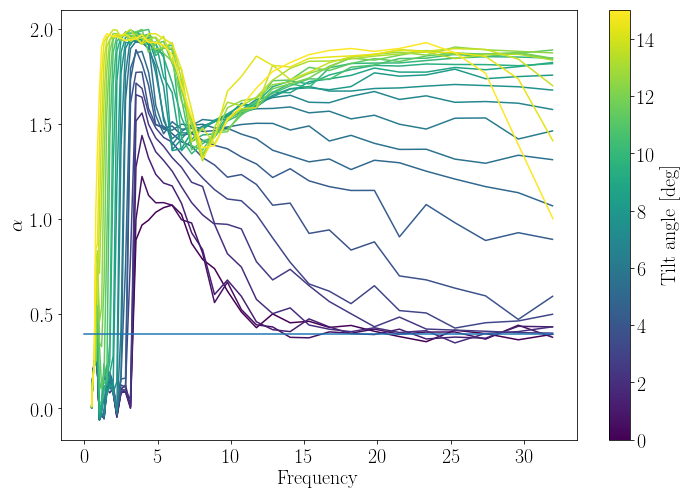

In [14]:
plt.rc('text', usetex=True)
plt.rc('font', family='serif')
fig, ax = plt.subplots(1,1,figsize=(10,7))

lx = [curve.frequency.values for i,curve in index.groupby("tilt")]
ly = [curve.alpha.values for i,curve in index.groupby("tilt")]
lz = [i for i,curve in index.groupby("tilt")]

lc = multiline(lx,ly,lz,ax=ax)

plt.plot(np.array([0,np.max(lx)]),0.391*np.array([1,1]))
size = 20
plt.xlabel(r'Frequency', fontsize=size)
plt.ylabel(r'$\alpha$', fontsize=size)
plt.tick_params(labelsize=size)
axcb = fig.colorbar(lc)
axcb.set_label('Tilt angle [deg]', fontsize = size)
axcb.ax.tick_params(labelsize=size)
fig.tight_layout()
fig.savefig(os.path.join(directory,'exponents.pdf'),pad_inches=0.1,bbox_inches='tight')

# A few examples

We look at a few points from the plot above to understand why we obtain that exponent.

### No tilt, very high frequency. 

In [15]:
name = index[(index.tilt == 0) & (index.frequency==32)].index
index.loc[name]

,name,frequency,tilt,alpha,beta
317,Tilt_0.0_deg_freq32.0_2019_03_02_13_16_59,32.0,0.0,0.391461,-2.128196


In [16]:
trj,bounds = load_trj(index.loc[name]["name"].values[0]+".lammpstrj",directory)

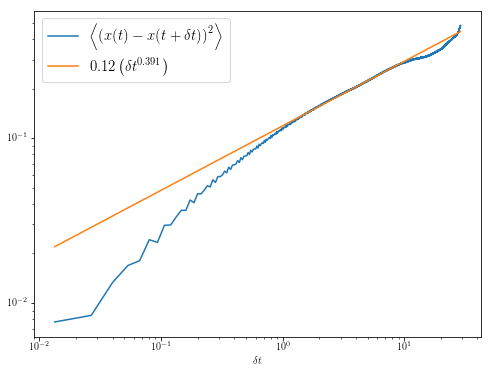

In [17]:
fig, ax = plt.subplots(1,1,figsize=(8,6))
mpl.rcParams.update({'font.size': 15})

msd_values = msd.loc[idx[name,:],"msd"].values
dt = msd.loc[idx[name,:],"msd"].index.get_level_values("dt").values

a = index.loc[name,"alpha"].values
b = np.exp(index.loc[name,"beta"].values)

plt.loglog(dt,msd_values, label = r'$\left<\left(x(t)-x(t+\delta t)\right)^2\right>$')
plt.loglog(dt,b*dt**a, label = r"$%2.2f\left(\delta t^{%2.3f}\right)$"%(b,a) )
plt.legend()
plt.xlabel("$\delta t$");

In [18]:
video_start = mgc.animate_trj(trj,
                              region = bounds.loc[0].values, radius = 1.4,
                              framerate = 75, start = 0, end = 30, step=10,speedup=1)
video_start = video_start.to_html5_video()

In [19]:
HTML(video_start)

###  Hight Tilt, High Freq. 

In [20]:
f = index.frequency.unique()[-2]
name = index[(index.tilt == 15) & (index.frequency==f)].index
index.loc[name]

,name,frequency,tilt,alpha,beta
998,Tilt_15.0_deg_freq29.6_2019_03_04_15_30_54,29.616021,15.0,1.390833,-0.163218


In [21]:
trj,bounds = load_trj(index.loc[name]["name"].values[0]+".lammpstrj",directory)

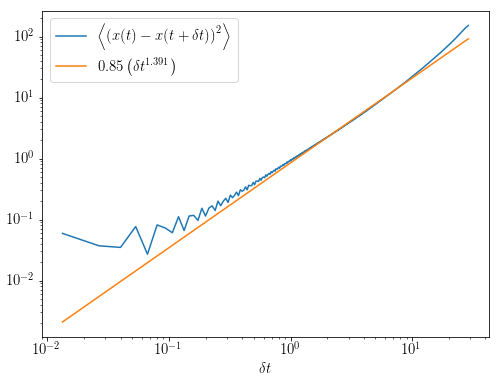

In [22]:
fig, ax = plt.subplots(1,1,figsize=(8,6))
mpl.rcParams.update({'font.size': 15})

msd_values = msd.loc[idx[name,:],"msd"].values
dt = msd.loc[idx[name,:],"msd"].index.get_level_values("dt").values

a = index.loc[name,"alpha"].values
b = np.exp(index.loc[name,"beta"].values)

plt.loglog(dt,msd_values, label = r'$\left<\left(x(t)-x(t+\delta t)\right)^2\right>$')
plt.loglog(dt,b*dt**a, label = r"$%2.2f\left(\delta t^{%2.3f}\right)$"%(b,a) )
plt.legend()
plt.xlabel("$\delta t$");

In [23]:
video_start = mgc.animate_trj(trj,
                              region = bounds.loc[0].values, radius = 1.4,
                              framerate = 75, start = 0, end = 30, step=10,speedup=1)
video_start = video_start.to_html5_video()

In [24]:
HTML(video_start)

###  Hight Tilt, High Freq. 

In [25]:
f = index.frequency.unique()[-1]
name = index[(index.tilt == 15) & (index.frequency==f)].index
index.loc[name]

,name,frequency,tilt,alpha,beta
999,Tilt_15.0_deg_freq32.0_2019_03_04_15_49_35,32.0,15.0,0.997079,-1.419893


In [26]:
trj,bounds = load_trj(index.loc[name]["name"].values[0]+".lammpstrj",directory)

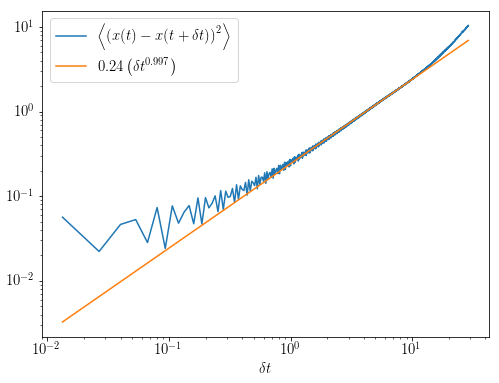

In [27]:
fig, ax = plt.subplots(1,1,figsize=(8,6))
mpl.rcParams.update({'font.size': 15})

msd_values = msd.loc[idx[name,:],"msd"].values
dt = msd.loc[idx[name,:],"msd"].index.get_level_values("dt").values

a = index.loc[name,"alpha"].values
b = np.exp(index.loc[name,"beta"].values)

plt.loglog(dt,msd_values, label = r'$\left<\left(x(t)-x(t+\delta t)\right)^2\right>$')
plt.loglog(dt,b*dt**a, label = r"$%2.2f\left(\delta t^{%2.3f}\right)$"%(b,a) )
plt.legend()
plt.xlabel("$\delta t$");

In [28]:
video_start = mgc.animate_trj(trj,
                              region = bounds.loc[0].values, radius = 1.4,
                              framerate = 75, start = 0, end = 30, step=10,speedup=1)
video_start = video_start.to_html5_video()

In [29]:
HTML(video_start)

###  Hight Tilt, High Freq. 

In [30]:
f = index.frequency.unique()[17]
t = index.tilt.unique()[9]

name = index[(index.tilt == t) & (index.frequency==f)].index
index.loc[name]

,name,frequency,tilt,alpha,beta
457,Tilt_5.625_deg_freq4.38_2019_03_02_21_53_46,4.382385,5.625,1.928005,5.257291


In [31]:
trj,bounds = load_trj(index.loc[name]["name"].values[0]+".lammpstrj",directory)

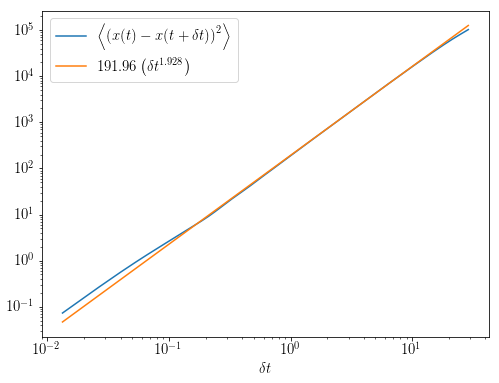

In [32]:
fig, ax = plt.subplots(1,1,figsize=(8,6))
mpl.rcParams.update({'font.size': 15})

msd_values = msd.loc[idx[name,:],"msd"].values
dt = msd.loc[idx[name,:],"msd"].index.get_level_values("dt").values

a = index.loc[name,"alpha"].values
b = np.exp(index.loc[name,"beta"].values)

plt.loglog(dt,msd_values, label = r'$\left<\left(x(t)-x(t+\delta t)\right)^2\right>$')
plt.loglog(dt,b*dt**a, label = r"$%2.2f\left(\delta t^{%2.3f}\right)$"%(b,a) )
plt.legend()
plt.xlabel("$\delta t$");

In [33]:
video_start = mgc.animate_trj(trj,
                              region = bounds.loc[0].values, radius = 1.4,
                              framerate = 75, start = 15, end = 16, step=1,speedup=0.1)
video_start = video_start.to_html5_video()

In [34]:
HTML(video_start)

This last case is a classic exchange example. 

# Directional Velocity as a function of Tilt angle. 

We define a directional velocity in such a way that particles traveling above and below have opposite positive directions. 

if $\vec{r_i}(t)$ and $\vec{v_i}(t)$ are the position and velocity of particle $i$ at time $t$, then we can write:

$$\mathbf{V}_i(t) = \vec{v_i}(t)\times\frac{\vec{r_i}(t)\cdot\hat{z}}{\left|\vec{r_i}(t)\cdot\hat{z}\right|}\hat{z}$$

In this expression, we can see that the second factor is simply a unit vector in $z$ that preserves the direction of the vertical component of the position. 

The order parameter then gives us a vector in the plane which points perpendicular to the direction of transport of the particles, with a magnitude proportional to the velocity. 

Below we calculate this "order parameter" for all particles at all times and show the average over particles and time for each point in the Frequency vs Tilt space. 

In [35]:
def unit(vec):
    return vec/np.linalg.norm(vec)

def z_comp(trj):
    trj2 = trj.copy(deep=True)
    trj2.iloc[:,0:2] = 0
    trj2.iloc[:,2] = trj2.iloc[:,2]/np.abs(trj2.iloc[:,2])
    return trj2

In [36]:
def vxr(name):
    trj,bounds = load_trj(name["name"]+".lammpstrj",directory)
    trj = unwrap_trj(trj,bounds)

    velocities = trj[["x","y","z"]].groupby("id").diff()/75
    unit_r = z_comp(trj[["x","y","z"]])
    v_edges = pd.DataFrame(np.cross(velocities,unit_r),index=velocities.index,columns=velocities.columns)

    return pd.DataFrame(data = v_edges.mean(),columns=[name.name]).transpose()

The next instruction takes about 9 hours. Be careful before running it. 

In [37]:
vxr = pd.concat([vxr(name) for i,name in tqdm_notebook(index.iterrows())])

A Jupyter Widget

In [38]:
vxr["file"] = vxr.index
vxr = vxr.set_index(["file"])

vxr.to_csv(os.path.join(directory,"VxRz.dat"), sep = "\t")

### Read VXR

In [39]:
vxr = pd.read_csv(os.path.join(directory,"VxRz.dat"), sep = "\t", index_col=[0])

vxr["frequency"] = index.loc[:,"frequency"]
vxr["tilt"] = index.loc[:,"tilt"]
vxr = vxr.set_index(["frequency","tilt"]).sort_index()

In [40]:
vxr.head()

x             y    z
frequency tilt                                  
0.5       0.000 -3.951515e-07  8.753507e-07  0.0
          0.625 -3.728967e-07  6.789856e-07  0.0
          1.250 -3.569898e-07  4.801917e-07  0.0
          1.875 -3.485435e-07  3.087803e-07  0.0
          2.500 -3.443608e-07  1.291743e-07  0.0

In [41]:
freqs = vxr.index.levels[0][0::]

We create a custom colormap.

In [42]:
brt = 0.8
drk = 0.7
blk = 0.0
lim = 0.1
cdict = {'red':   [[0.0,  1.0, 1.0],
                   [0.5-lim,  drk, drk],
                   [0.5+lim,  blk, blk],
                   [1.0,  brt, brt]],
         'green': [[0.0,  brt, brt],
                   [0.5,  0.0, 0.0],
                   [1.0,  brt, brt]],
         'blue':  [[0.0,  brt, brt],
                   [0.5-lim,  blk, blk],
                   [0.5+lim,  drk, drk],
                   [1.0,  1.0, 1.0]]}

old_cm = mpl.colors.LinearSegmentedColormap('conv_RdBu', segmentdata=cdict, N=256)

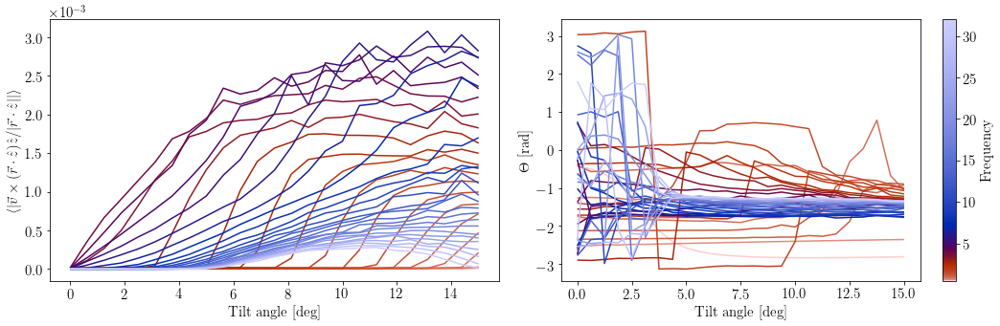

In [43]:
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

old_cm_numeric = old_cm((np.linspace(0,1,256)**(1/3)))
new_cm = mpl.colors.ListedColormap(old_cm_numeric)
#new_cm = mpl.colors.ListedColormap(Blues_8.mpl_colormap(np.linspace(1,2,256)**2.5-1))

fig, ax = plt.subplots(1,2,figsize=(15,5))
mpl.rcParams.update({'font.size': 15})

lx = [vxr_line.index.get_level_values("tilt") for i,vxr_line in vxr.loc[idx[freqs,:],:].groupby("frequency")]
ly = [(vxr_line**2).sum(axis=1)**(1/2) for i,vxr_line in vxr.loc[idx[freqs,:],:].groupby("frequency")]
lth = [np.arctan2(vxr_line.x,vxr_line.y) for i,vxr_line in vxr.loc[idx[freqs,:],:].groupby("frequency")]
lz = [f for f,vxr_line in vxr.loc[idx[freqs,:],:].groupby("frequency")]

lc = multiline(lx,ly,lz,ax=ax[0],cmap = new_cm)
lc = multiline(lx,lth,lz,ax=ax[1],cmap = new_cm)

ax[0].set_xlabel(r'Tilt angle [deg]')
ax[1].set_xlabel(r'Tilt angle [deg]')

ax[0].ticklabel_format(style='sci', axis='y', scilimits=(0,0))

ax[0].set_ylabel(r"$\left<\left|{\vec{v}\times(\vec{r}\cdot\hat{z})\hat{z}}/{\left|\vec{r}\cdot\hat{z}\right|}\right|\right>$")
ax[1].set_ylabel(r"$\Theta$ [rad]")

axcb = fig.colorbar(lc)
axcb.set_label('Frequency')

fig.tight_layout()
fig.savefig(os.path.join(directory,'flow.pdf'),pad_inches=0.1,bbox_inches='tight')